In [1]:
from bitarray import bitarray
import scipy.stats
import pandas as pd
import numpy as np

import random
import msprime
import pyslim

In [2]:
%matplotlib inline

# Make inline plots vector graphics instead of raster graphics
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('pdf', 'svg')

import matplotlib
import matplotlib.pyplot as plt
import mpld3

import seaborn as sns

sns.set() # sets seaborn default "prettyness:
sns.set_style("white")
sns.set_context("paper")

## Simulate an actual hard sweep using SlimGUI

Trees file is generated using the Slim GUI and the spec in `partialsweep.slim`

    initialize() {
        initializeTreeSeq();
        initializeMutationRate(0);
        initializeMutationType("m1", 0.5, "f", 0.0);
        initializeGenomicElementType("g1", m1, 1.0);
        initializeMutationType("m3", 1.0, "f", 0.05); // introduced
        initializeGenomicElement(g1, 0, 10e6-1);
        initializeRecombinationRate(1e-8);
    }
    1 {
        defineConstant("simID", getSeed());
        sim.addSubpop("p1", 20000);
    }
    10000 late() {
        target = sample(p1.genomes, 1);
        target.addNewDrawnMutation(m3, 5e6);
        sim.treeSeqOutput("/tmp/slim_" + simID + ".trees");
    }
    10000:100000 late() {
        if (sim.countOfMutationsOfType(m3) == 0) {
            if (sum(sim.substitutions.mutationType == m3) == 1) {
                cat(simID + ": FIXED\n");
    //			sim.treeSeqOutput("/Users/kmt/Dropbox/Research/sweeps/iHA/sweep.trees");
    //			sim.simulationFinished();
            } else {
                cat(simID + ": LOST - RESTARTING\n");

                sim.readFromPopulationFile("/tmp/slim_" + simID + ".trees");
                setSeed(rdunif(1, 0, asInteger(2^32) - 1));
            }
        }
        mut = sim.mutationsOfType(m3);
        if (size(mut) == 0)
            sim.simulationFinished();
        else if (mut.selectionCoeff != 0.0)
            if (sim.mutationFrequencies(NULL, mut) >= 0.5) {
                mut.setSelectionCoeff(0.0);			
    //			sim.treeSeqOutput("/Users/kmt/Dropbox/Research/sweeps/iHA/sweep.trees");
    //			sim.simulationFinished();		
            }
    }
    12000: late() {
        sim.treeSeqOutput("/Users/kmt/Dropbox/Research/sweeps/iHA/sweep.trees");
        sim.simulationFinished();
    }
    //10000 late() {
    //	sim.treeSeqOutput("/Users/kmt/Dropbox/Research/sweeps/iHA/background.trees");
    //	sim.simulationFinished();
    //}

## Read in simulation data without sweep

This is used for control and calculation of empirical moments of the statistic under the null.

In [3]:
sample_size = 100
mutation_rate = 1.5e-8

In [4]:
trees = pyslim.load('background.trees')

# Overlay neutral mutations and make bit arrays for each SNP:
sample_ids = sorted(random.sample(list(trees.samples()), sample_size))

trees_sample = trees.simplify(samples=sample_ids, filter_zero_mutation_sites=True, filter_individuals=True)
mutated_trees = msprime.mutate(trees_sample, rate=mutation_rate, random_seed=7)
# mutated.dump("./sweep_overlaid.trees") 
mutated_trees.pairwise_diversity() / mutated_trees.sequence_length

ref_lst = list()
for i, variant in enumerate(mutated_trees.variants()):
    ba = bitarray(list(variant.genotypes))
    if ba.any():
        ref_lst.append((variant.site.position, ba))

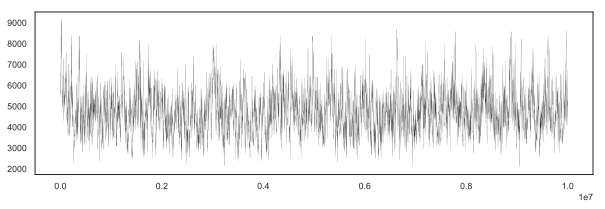

In [5]:
ts = mutated_trees
# Measure the tree height at each base position
height_for_pos = np.zeros(int(ts.sequence_length))
for tree in ts.trees():
    mean_height = np.mean([tree.time(root) for root in tree.roots])
    left, right = map(int, tree.interval)
    height_for_pos[left: right] = mean_height
height_for_pos
plt.figure(figsize=(10,3))
plt.plot(height_for_pos, linewidth=0.1, color='black') ;

## Read in simulation data with sweep:

In [6]:
trees = pyslim.load('sweep.trees')
#trees = pyslim.load('background.trees')

# Overlay neutral mutations and make bit arrays for each SNP:
sample_ids = sorted(random.sample(list(trees.samples()), sample_size))

trees_sample = trees.simplify(samples=sample_ids, filter_zero_mutation_sites=True, filter_individuals=True)
mutated_trees = msprime.mutate(trees_sample, rate=mutation_rate, random_seed=7)
# mutated.dump("./sweep_overlaid.trees") 
mutated_trees.pairwise_diversity() / mutated_trees.sequence_length

lst = list()
for i, variant in enumerate(mutated_trees.variants()):
    ba = bitarray(list(variant.genotypes))
    if ba.any():
        lst.append((variant.site.position, ba))

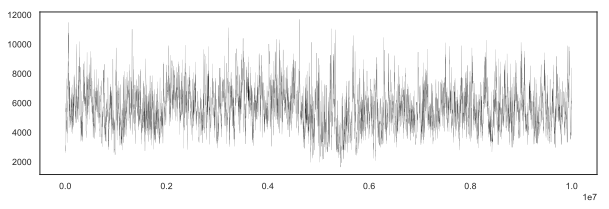

In [7]:
ts = mutated_trees
# Measure the tree height at each base position
height_for_pos = np.zeros(int(ts.sequence_length))
for tree in ts.trees():
    mean_height = np.mean([tree.time(root) for root in tree.roots])
    left, right = map(int, tree.interval)
    height_for_pos[left: right] = mean_height
height_for_pos
plt.figure(figsize=(10,3))
plt.plot(height_for_pos, linewidth=0.1, color='black') ;

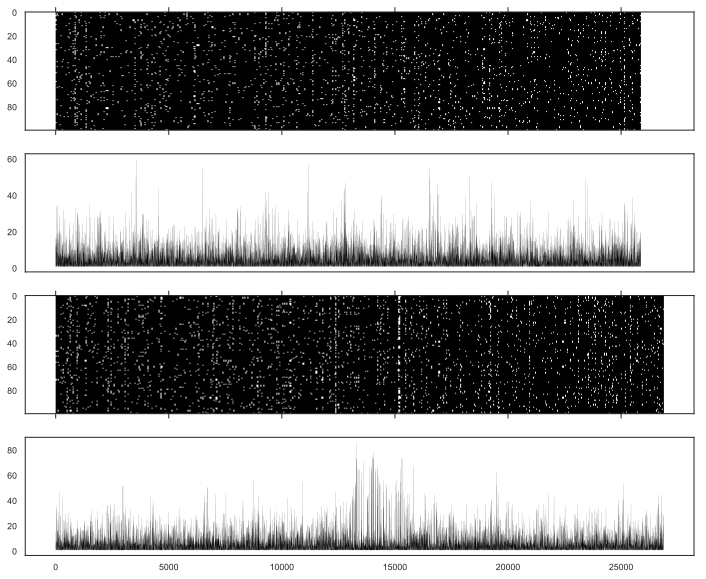

In [8]:
i, b = zip(*ref_lst)
mat_ref = np.array([list(map(int, x)) for x in b]).T

i, b = zip(*lst)
mat = np.array([list(map(int, x)) for x in b]).T
fig, axes = plt.subplots(4, figsize=(12,10), sharex=True)

axes[0].matshow(mat_ref, aspect='auto', cmap='binary_r')#.axis.axis('off')
axes[1].plot(np.sum(mat_ref, axis=0), linewidth=0.1, color='black')
axes[2].matshow(mat, aspect='auto', cmap='binary_r') ;
axes[3].plot(np.sum(mat, axis=0), linewidth=0.1, color='black') ;


## Compute statistic

In [9]:
def get_dist(lst, pos, end, min_count, inside):

    ins = lst[pos][1].copy()
    outs = ~ins    
    if not inside:
        ins, outs = ~ins, ~outs
    
    dist = list()    
    positions = pos < end and range(pos, end) or range(pos, end-1, -1)
    for i in positions:
        deriv_pos, deriv = lst[i]
        if (outs & deriv).any() and not (ins & deriv) == ins:
            ins &= ~deriv
            outs = ~ins
        dist.append((deriv_pos, ins.count()))
        if ins.count() < min_count:
            break            
    return dist
        
def get_stat(focal, data):
    focal_freq = data[0][1]
    stat = 0
    prev = focal
    for pos, freq in data:
        stat += abs(prev - pos) * freq
        prev = pos
    return stat


cut_off = 5
    
stats = list()
for i in range(len(lst)):
  
    in_right = get_dist(lst, i, len(lst), cut_off, True)
    in_left = get_dist(lst, i, 0, cut_off, True)
    in_stat = get_stat(lst[i][0], in_right) + get_stat(lst[i][0], in_left)
    
    out_right = get_dist(lst, i, len(lst), cut_off, False)
    out_left = get_dist(lst, i, 0, cut_off, False)
    out_stat = get_stat(lst[i][0], out_right) + get_stat(lst[i][0], out_left)
    
    if in_stat and out_stat:
        # is this ok? what else can we do if out_stat is zero?
        stats.append((i, lst[i][0], lst[i][1].count(), in_stat, out_stat))
        
        
ref_stats = list()
for i in range(len(ref_lst)):
  
    in_right = get_dist(ref_lst, i, len(ref_lst), cut_off, True)
    in_left = get_dist(ref_lst, i, 0, cut_off, True)
    in_stat = get_stat(ref_lst[i][0], in_right) + get_stat(ref_lst[i][0], in_left)
    
    out_right = get_dist(ref_lst, i, len(ref_lst), cut_off, False)
    out_left = get_dist(ref_lst, i, 0, cut_off, False)
    out_stat = get_stat(ref_lst[i][0], out_right) + get_stat(ref_lst[i][0], out_left)
    
    if in_stat and out_stat:
        # is this ok? what else can we do if out_stat is zero?
        ref_stats.append((i, ref_lst[i][0], ref_lst[i][1].count(), in_stat, out_stat))

## Empirical moments of statistic by folded derived allele frequency

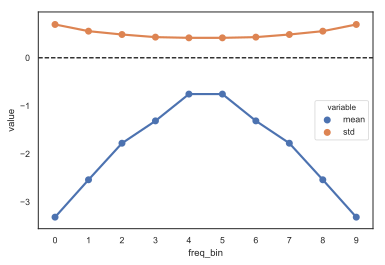

In [10]:
freq_bin_size = 10

empirical_moments = (pd.DataFrame
     .from_records(ref_stats, columns=['idx', 'pos', 'freq', 'in_stat', 'out_stat'])
     .assign(stat=lambda df: np.log(df.in_stat / df.out_stat),
             freq_bin = lambda df: df.freq // freq_bin_size)
     .groupby('freq_bin').stat
     .agg(['mean', 'std'])
    )
#empirical_moments

empirical_moments = empirical_moments.reset_index().loc[lambda df: df.freq_bin < sample_size//freq_bin_size / 2]
#empirical_moments

df = empirical_moments.copy()
df['freq_bin'] = sample_size//freq_bin_size - df.freq_bin - 1
df = df.sort_values(by='freq_bin').set_index('freq_bin')
empirical_moments = empirical_moments.set_index('freq_bin').append(pd.DataFrame(df))
#empirical_moments

sns.pointplot(x='freq_bin', y='value', hue='variable', data=empirical_moments.reset_index().melt(id_vars='freq_bin'))
plt.axhline(0, color='black', linestyle='dashed') ; 

## Compute p-values

In [11]:
#p_values_at_sites = list()
p_values = list()
pos_values = list()
stat_values = list()
in_stats, out_stats = list(), list()

for idx, pos, freq, in_stat, out_stat in stats:
    freq_bin = freq // freq_bin_size
    stat = (np.log(in_stat / out_stat) - \
            empirical_moments.loc[freq_bin, 'mean'] ) / empirical_moments.loc[freq_bin, 'std']
    stat_values.append(stat)
    p = 1 - 2 * abs(scipy.stats.norm.cdf(stat) - 0.5)
    p = p and p or 1e-16 # convert zero p values to smallest value 
#     p_values_at_sites.append((pos, p))    
    p_values.append(p)    
    pos_values.append(pos)    

    # p might thus be interpreted as log10(1/P) where P is the two‐sided P‐value 
    # associated to the neutral hypothesis (no selection).
    in_stats.append(in_stat)
    out_stats.append(out_stat)


ref_stat_values = list()
ref_p_values = list()
for idx, pos, freq, in_stat, out_stat in ref_stats:
    freq_bin = freq // freq_bin_size
    stat = (np.log(in_stat / out_stat) - \
            empirical_moments.loc[freq_bin, 'mean'] ) / empirical_moments.loc[freq_bin, 'std']
    ref_stat_values.append(stat)    
    p = 1 - 2 * abs(scipy.stats.norm.cdf(stat) - 0.5)
    p = p and p or 1e-16 # convert zero p values to smallest value 
    ref_p_values.append(p)
    

pos = pos_values  

In [13]:
df = pd.DataFrame({'pos':pos, 'p':p, 'in_stat':in_stats, 'out_stat':out_stats})
df = df.melt(id_vars='pos', value_vars=['in_stat', 'out_stat'])

g = sns.lmplot(x='pos', y='value',row='variable', sharey=True, 
               data=df, lowess=True, aspect=3, height=3, 
               scatter_kws={'color':'grey', 'alpha': 0.2}, line_kws={'color': 'white'}) ;

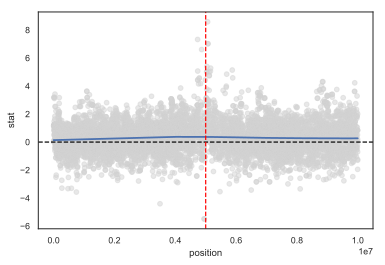

In [12]:
df = pd.DataFrame({'pos':pos, 'stat':stat_values})

fig, ax = plt.subplots(1, figsize=(10,4))
sns.regplot(x='pos', y='stat', data=df, lowess=True, scatter_kws={'color':'lightgrey', 'alpha':0.5})
plt.ylabel('stat')
plt.xlabel('position') 
plt.axhline(0, color='black', linestyle='dashed') ;
plt.axvline(5000000, color='red', linestyle='dashed') ;
# plt.axvline(4000, color='red', linestyle='dashed') ;
# plt.axvline(6000, color='red', linestyle='dashed') ;

## Correction for multiple testing

Boneferroni correction:

In [14]:
# n = len(p_values)

Estimation of effective sample size (ESS):
    
    https://www.johndcook.com/blog/2017/06/27/effective-sample-size-for-mcmc/

The corrlation should decrease with larger lag, but it does not make sense to allow to account for negative correlation. So we use the min if it looks reasonable:

580.5547953368107

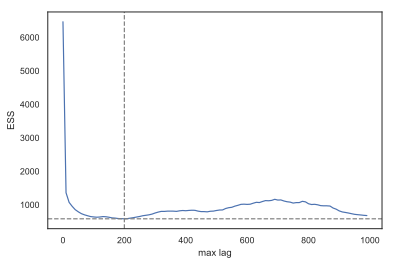

In [15]:
def ess(l, max_lag):
    s = pd.Series(l)
    return len(l) / (1 + 2 * sum(s.corr(s.shift(k)) for k in range(max_lag)))

tmp = list()
for i in range(0, 1000, 10):
    tmp.append((i, ess(ref_stat_values, max_lag=i)))
x, y = zip(*tmp)
plt.plot(x, y)
plt.ylabel('ESS')
plt.xlabel('max lag')

min_ess = min(y)
max_lag = x[y.index(min_ess)]
n = ess(ref_stat_values, max_lag=max_lag)
p_value_cut = -np.log(0.05 / n)

plt.axvline(max_lag, color='grey', linestyle='dashed')
plt.axhline(min_ess, color='grey', linestyle='dashed')

n, p_value_cut

## Manhattan plot

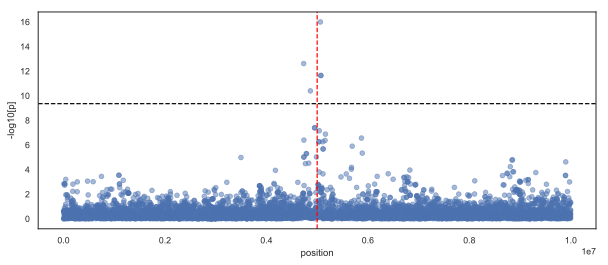

In [16]:
fig, ax = plt.subplots(1, figsize=(10,4))
plt.scatter(pos, -np.log10(p_values), alpha=0.5)
plt.ylabel('-log10[p]')
plt.xlabel('position') 
plt.axhline(p_value_cut, color='black', linestyle='dashed') ;
plt.axvline(5000000, color='red', linestyle='dashed') ;

## Check distributions

Check normal distribution of stats

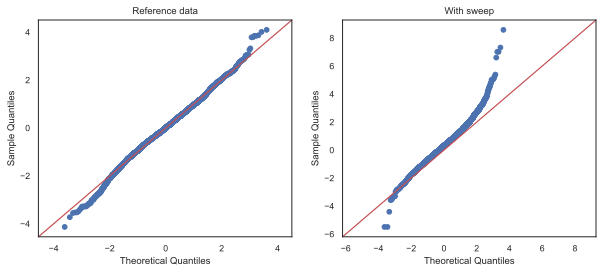

In [19]:
import statsmodels.api as sm
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4))
sm.qqplot(np.array(ref_stat_values), scipy.stats.norm, line='45', ax=ax1)
ax1.set_title("Reference data")
sm.qqplot(np.array(stat_values), scipy.stats.norm, line='45', ax=ax2)
ax2.set_title("With sweep") ;

Check uniform distribution of p-values

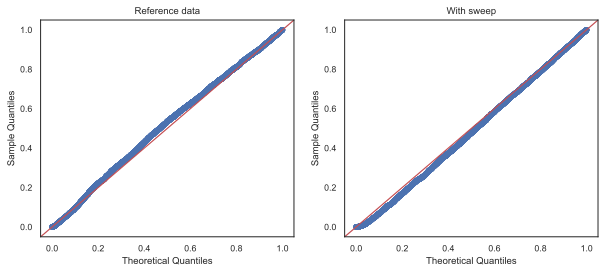

In [20]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4))
sm.qqplot(np.array(ref_p_values), scipy.stats.uniform, line='45', ax=ax1)
ax1.set_title("Reference data")
sm.qqplot(np.array(p_values), scipy.stats.uniform, line='45', ax=ax2) 
ax2.set_title("With sweep") ;